# Advanced ML Modelling

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# from statsmodels.regression import linear_model
# import statsmodels.api as sm
from scipy import stats
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objs as go
import warnings
import joblib
from tqdm import tqdm

#a bunch of imports!
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.decomposition import PCA
from sklearn.tree import DecisionTreeClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import accuracy_score
from sklearn.compose import ColumnTransformer
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier


# Text Processing
import string
import nltk
import re 
# from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
nltk.download('stopwords')
from nltk.corpus import stopwords 
from nltk.stem import PorterStemmer


# Lemmatization

from nltk.stem import WordNetLemmatizer
from nltk.corpus import wordnet
from nltk.tokenize import word_tokenize
from nltk.tag import pos_tag
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')
nltk.download('wordnet')

# Imbalance learning
from sklearn.utils import resample
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline as ImbPipeline

# Model Evaluation
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from sklearn.metrics import precision_score, recall_score, f1_score, accuracy_score, confusion_matrix

warnings.filterwarnings('ignore')
%matplotlib inline

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/wellswang/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /Users/wellswang/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /Users/wellswang/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/wellswang/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


Using the baseline models and model evaluation strategy you built in the previous part, we will springboard into advanced model building, optimization, evaluation and interpretation. Here are the steps:
- Create a pipeline for tokenization, scaling, and imbalanced learning
- Implement the pipeline for hyperparameter optimization with baseline model
- Apply the methods to other ML models

In [8]:
# Read the if start from here
prod_df = pd.read_csv('data/prod_df.csv')

## Pipeline

For efficiency purposes and reusability, here we want to wrap up all our feature engineering steps and modelling with column transformer and pipelines.

**First, we need to retrieve our tokenizer**

In [10]:
# Custom tokenizer using lemmatizing
def get_wordnet_pos(treebank_tag):
    if treebank_tag.startswith('J'):
        return wordnet.ADJ
    elif treebank_tag.startswith('V'):
        return wordnet.VERB
    elif treebank_tag.startswith('N'):
        return wordnet.NOUN
    elif treebank_tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN


lemmatizer = WordNetLemmatizer()

ENGLISH_STOP_WORDS = stopwords.words('english')
# Include words we want to clean in stop words
ENGLISH_STOP_WORDS.extend(['none','no', 'nothing','n','a','negative','positive'])

def my_lemma_tokenizer(sentence):
    # # remove punctuation, numbers, and set to lower case
    # sentence = re.sub(r'[^a-zA-Z\s]', '', sentence).lower()
    
    # remove punctuation and set to lower case
    for punctuation_mark in string.punctuation:
        sentence = sentence.replace(punctuation_mark,'').lower()

    # split sentence into words
    listofwords = sentence.split(' ')
    pos_tags = nltk.pos_tag(listofwords)
    listoflemmatized_words = []
    
    # remove stopwords and any tokens that are just empty strings
    for word, tag in pos_tags:
        if (not word in ENGLISH_STOP_WORDS) and (word!=''):
            # Lemmatized words
            
            lemmatized_word = lemmatizer.lemmatize(word,get_wordnet_pos(tag))
            listoflemmatized_words.append(lemmatized_word)

    return listoflemmatized_words

**Next, we can use pipeline to wrap all the steps together**  
- TfidfVectorizer
- StandardScaler
- OneHotEncoder
- SMOTE Upsamping
- ML model

**Train Test Split**

In [87]:
# Spliting features X and target y 
X = prod_df.drop(['trending', 'product_id'], axis=1)
y = prod_df['trending']

# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=123)
print(X_train.shape, X_test.shape)

(28962, 8) (7241, 8)


**Defining Pipeline Function**

In [124]:
def hm_pipeline(model):
    """
    Create an imbalanced-learn pipeline for text and categorical feature processing,
    applying Synthetic Minority Over-sampling Technique (SMOTE), and a specified model.

    Parameters:
    - model: The classification model to be used in the pipeline.

    Returns:
    - ImbPipeline: An imbalanced-learn pipeline that includes text and categorical feature processing,
      SMOTE for dealing with class imbalance, and the specified classification model.
    
    Example:
    >>> from sklearn.ensemble import RandomForestClassifier
    >>> from imblearn.pipeline import Pipeline as ImbPipeline
    >>> model = RandomForestClassifier()
    >>> pipeline = hm_pipeline(model)
    >>> pipeline.fit(X_train, y_train)
    >>> y_pred = pipeline.predict(X_test)
    """
    # Columns for one-hot encoding
    categorical_columns = ['product_type_name', 'product_group_name', 'index_group_name', 'section_name', 'graphical_appearance_name']
    
    # Create the column transformations list + columns to which to apply
    col_transforms = [('desc', TfidfVectorizer(max_features=500, min_df=10, tokenizer=my_lemma_tokenizer, ngram_range=(1, 3)), 'detail_desc'),
                      ('name', TfidfVectorizer(max_features=500, min_df=10, tokenizer=my_lemma_tokenizer, ngram_range=(1, 3)), 'prod_name'),
                      ('normalise', StandardScaler(), ['unit_price']),
                      ('cat', OneHotEncoder(drop='first'), categorical_columns)
                     ]
    
    # Create the column transformer
    col_trans = ColumnTransformer(col_transforms)
    
    # List of estimators in the pipeline
    estimators = [('preprocessor', col_trans),
                  ('to_dense', FunctionTransformer(func=to_dense, validate=False)),
                  ('smote', SMOTE(random_state=123)),
                  ('clf', model)
                 ]
    
    # Create and return the imbalanced-learn pipeline
    return ImbPipeline(estimators)

**Testing out the pipeline with Logistic Regression Model**

In [37]:
# Specify the model for the pipeline
model_params = {'random_state':123}
model = LogisticRegression(**model_params)

# Instantiate pipeline with our custom function
pipe = hm_pipeline(model)

# Fitting the pipeline with training data
pipe.fit(X_train, y_train)

# Predicting with test data
y_pred = pipe.predict(X_test)

# classification report
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

       False       0.97      0.80      0.88      6475
        True       0.32      0.80      0.46       766

    accuracy                           0.80      7241
   macro avg       0.65      0.80      0.67      7241
weighted avg       0.90      0.80      0.83      7241



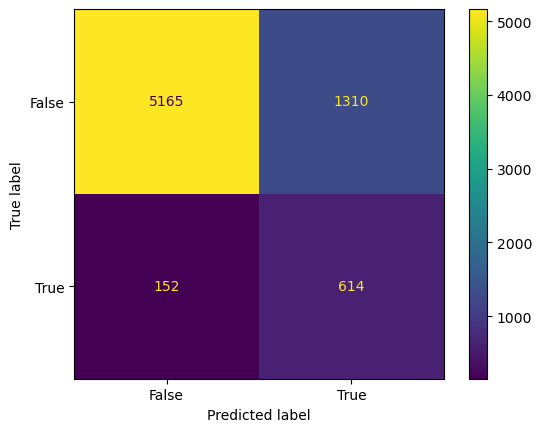

In [27]:
# Evaluate with confusion matrix
ConfusionMatrixDisplay.from_estimator(pipe, X_test, y_test)
plt.show()

Here we can see that we have a slightly higher recall score (**80%**). That might be due to the order difference of our steps (putting standard scaler before one-hot encoder).

**For model comparison, we also want to create a function that calculates our desired evaluation metrics**

In [43]:
def calculate_metrics(model_name, model_params, y_true, y_pred):
    """
    Calculate precision, recall, F1 score, accuracy, and false positive rate.

    Parameters:
    - y_true: true labels
    - y_pred: predicted labels
    - model_name: name of the classification model
    - model_params: dictionary containing the model parameters

    Returns:
    - metrics_dict: a dictionary containing precision, recall, f1_score, accuracy, false_positive_rate,
      model_name, and model_params
    """
    # Calculate confusion matrix
    cm = confusion_matrix(y_true, y_pred)

    # Calculate true positives, false positives, false negatives, true negatives
    tp = cm[1, 1]
    fp = cm[0, 1]
    fn = cm[1, 0]
    tn = cm[0, 0]

    # Calculate precision, recall, F1 score, accuracy, and false positive rate
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)
    accuracy = accuracy_score(y_true, y_pred)
    false_positive_rate = fp / (fp + tn) if (fp + tn) != 0 else 0.0

    # Create a dictionary to store the metrics and model specifications
    metrics_dict = {
        'model_name': model_name,
        'model_params': model_params,
        'precision': precision,
        'recall': recall,
        'f1_score': f1,
        'accuracy': accuracy,
        'false_positive_rate': false_positive_rate
    }

    return metrics_dict

**Model Evaluation**

In [45]:
# Extract model specifications
model_name = 'LogisticRegression'
model_params = pipe.named_steps['clf'].get_params()

# Calculate metrics and include model specifications
metrics_dict = calculate_metrics(model_name, model_params, y_test, y_pred)

# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([metrics_dict])

# Reorder columns to have model_name and model_params at the front
columns_order = ['model_name', 'model_params', 'precision', 'recall', 'f1_score', 'accuracy', 'false_positive_rate']
metrics_df = metrics_df[columns_order]

# Display the resulting DataFrame
metrics_df

,model_name,model_params,precision,recall,f1_score,accuracy,false_positive_rate
0,LogisticRegression,"{'C': 1.0, 'class_weight': None, 'dual': False...",0.319127,0.801567,0.456506,0.798094,0.202317


**Let's use the pipeline and evaluation metrics function for hyperparmater optimization with our baseline model**

In [58]:
def print_progress_bar(iteration, total, prefix='', suffix='', length=30, fill='█', print_end='\r'):
    """
    Print a text-based progress bar.

    Parameters:
    - iteration: Current iteration (int)
    - total: Total iterations (int)
    - prefix: Prefix string (str)
    - suffix: Suffix string (str)
    - length: Length of the progress bar (int)
    - fill: Fill character for the progress bar (str)
    - print_end: String appended after the progress bar (e.g., '\r' for carriage return)
    """
    percent = ("{0:.1f}").format(100 * (iteration / float(total)))
    filled_length = int(length * iteration // total)
    bar = fill * filled_length + '-' * (length - filled_length)
    print(f'\r{prefix} |{bar}| {percent}% {suffix}', end=print_end, flush=True)

**Looping through different Cs and store results**

In [61]:
# Empty dataframe to store results
all_metrics_df = pd.DataFrame()

# For loop through different C's for logistic regression
Cs = [0.001, 0.01, 0.1, 1, 10, 100]
for i, c in enumerate(Cs):
    # Progress
    print_progress_bar(i+1, len(Cs), prefix='Progress:', suffix='Complete', length=30)
    
    # Specify the model for the pipeline
    model_name = 'LogisticRegression'
    model_params = {'C':c, 'random_state':123}
    model = LogisticRegression(**model_params)
    
    # Instantiate pipeline with our custom function
    pipe = hm_pipeline(model)
    
    # Fitting the pipeline with training data
    pipe.fit(X_train, y_train)
    
    # Predicting with test data
    y_pred = pipe.predict(X_test)
    
    # Calculate metrics and include model specifications
    metrics_dict = calculate_metrics(model_name, model_params, y_test, y_pred)
    
    # Convert the dictionary to a DataFrame
    metrics_df = pd.DataFrame([metrics_dict])
    
    # Reorder columns to have model_name and model_params at the front
    columns_order = ['model_name', 'model_params', 'precision', 'recall', 'f1_score', 'accuracy', 'false_positive_rate']
    metrics_df = metrics_df[columns_order]

    # Append the metrics_df to the all_metrics_df
    all_metrics_df = pd.concat([all_metrics_df, metrics_df], ignore_index=True)

# Display the resulting DataFrame
all_metrics_df

,model_name,model_params,precision,recall,f1_score,accuracy,false_positive_rate
0,LogisticRegression,"{'C': 0.001, 'random_state': 123}",0.257201,0.827676,0.392448,0.728905,0.282780
1,LogisticRegression,"{'C': 0.01, 'random_state': 123}",0.271296,0.877285,0.414431,0.737743,0.278764
2,LogisticRegression,"{'C': 0.1, 'random_state': 123}",0.299535,0.840731,0.441701,0.775169,0.232587
3,LogisticRegression,"{'C': 1, 'random_state': 123}",0.319127,0.801567,0.456506,0.798094,0.202317
4,LogisticRegression,"{'C': 10, 'random_state': 123}",0.321101,0.776762,0.454372,0.802652,0.194286
5,LogisticRegression,"{'C': 100, 'random_state': 123}",0.320623,0.779373,0.454338,0.801961,0.195367


In [62]:
# saving logreg results
# all_metrics_df.to_csv('data/logreg_results.csv', index=False)

Since the goal for this project is to predict trending items, and the data is imbalanced, what we want to optimize is the recall score instead of accuracy. Hence, we might consider the best logistic regression model to be the one with C=0.01, which can identify 87.7% of trending items.

**Next, we can start applying our pipeline on other models**

## SVM

We start with the kernel SVM model here, and loop through different Cs (Regularization Parameter). A smaller C encourages a larger margin and a simpler decision boundary, but may misclassify some points. A larger C gives a lower margin but classifies all training points correctly.

In [66]:
# For loop through different C's for logistic regression
Cs = [0.001, 0.01, 0.1, 1, 10, 100]
for i, c in enumerate(Cs):
    # Specify the model for the pipeline
    model_name = 'SVM'
    model_params = {'C':c, 'kernel':'rbf', 'random_state':123}
    model = SVC(**model_params)
    
    # Instantiate pipeline with our custom function
    pipe = hm_pipeline(model)
    
    # Fitting the pipeline with training data
    pipe.fit(X_train, y_train)
    
    # Predicting with test data
    y_pred = pipe.predict(X_test)
    
    # Calculate metrics and include model specifications
    metrics_dict = calculate_metrics(model_name, model_params, y_test, y_pred)
    
    # Convert the dictionary to a DataFrame
    metrics_df = pd.DataFrame([metrics_dict])
    
    # Reorder columns to have model_name and model_params at the front
    columns_order = ['model_name', 'model_params', 'precision', 'recall', 'f1_score', 'accuracy', 'false_positive_rate']
    metrics_df = metrics_df[columns_order]

    # Append the metrics_df to the all_metrics_df
    all_metrics_df = pd.concat([all_metrics_df, metrics_df], ignore_index=True)

    # Progress
    print_progress_bar(i+1, len(Cs), prefix='Progress:', suffix='Complete', length=30)
    
# Display the resulting DataFrame
all_metrics_df

,model_name,model_params,precision,recall,f1_score,accuracy,false_positive_rate
0,LogisticRegression,"{'C': 0.001, 'random_state': 123}",0.257201,0.827676,0.392448,0.728905,0.282780
1,LogisticRegression,"{'C': 0.01, 'random_state': 123}",0.271296,0.877285,0.414431,0.737743,0.278764
2,LogisticRegression,"{'C': 0.1, 'random_state': 123}",0.299535,0.840731,0.441701,0.775169,0.232587
3,LogisticRegression,"{'C': 1, 'random_state': 123}",0.319127,0.801567,0.456506,0.798094,0.202317
4,LogisticRegression,"{'C': 10, 'random_state': 123}",0.321101,0.776762,0.454372,0.802652,0.194286
5,LogisticRegression,"{'C': 100, 'random_state': 123}",0.320623,0.779373,0.454338,0.801961,0.195367
6,SVM,"{'C': 0.001, 'kernel': 'rbf', 'random_state': ...",0.253412,0.557441,0.348429,0.779450,0.194286
7,SVM,"{'C': 0.01, 'kernel': 'rbf', 'random_state': 123}",0.262642,0.874674,0.403979,0.726971,0.290502
8,SVM,"{'C': 0.1, 'kernel': 'rbf', 'random_state': 123}",0.305825,0.822454,0.445860,0.783732,0.220849
9,SVM,"{'C': 1, 'kernel': 'rbf', 'random_state': 123}",0.407149,0.609661,0.488238,0.864798,0.105019


In [67]:
# saving logreg results
# all_metrics_df.to_csv('data/svm_results.csv', index=False)

## XGBoost

In [120]:
# Specify the model for the pipeline
model_name = 'XGBoost'
model_params = {'objective':'binary:logistic', 
                'random_state':123}
model = XGBClassifier(**model_params)

# Instantiate pipeline with our custom function
pipe = hm_pipeline(model)

# Define the hyperparameter grid to search
param_grid = {
    'clf__learning_rate': [0.01, 0.05, 0.1, 0.3, 0.5],
    'clf__n_estimators': [50, 100, 200, 300, 500]
}

# Use GridSearchCV to find the best combination of hyperparameters
grid_search = GridSearchCV(pipe, param_grid, cv=3, scoring='recall', verbose=2)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Print classification report
from sklearn.metrics import classification_report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Calculate metrics and include model specifications
metrics_dict = calculate_metrics(model_name, best_params, y_test, y_pred)

# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([metrics_dict])

# Reorder columns to have model_name and model_params at the front
columns_order = ['model_name', 'model_params', 'precision', 'recall', 'f1_score', 'accuracy', 'false_positive_rate']
metrics_df = metrics_df[columns_order]
metrics_df

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=50; total time=  26.8s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=50; total time=  27.3s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=50; total time=  28.3s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=100; total time=  29.8s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=100; total time=  28.9s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=100; total time=  31.9s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=200; total time=  35.2s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=200; total time=  34.4s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=200; total time=  33.7s
[CV] END classifier__learning_rate=0.01, classifier__n_estimators=300; total time=  38.9s
[CV] END classifier__learning_rate=0.01, c

,model_name,model_params,precision,recall,f1_score,accuracy,false_positive_rate
0,XGBoost,"{'classifier__learning_rate': 0.01, 'classifie...",0.255233,0.827676,0.390154,0.726281,0.285714


## Random Forest

**Random Forest Baseline**

In [122]:
# Specify the model for the pipeline
model_name = 'RandomForest'
model_params = {'random_state':123}
model = RandomForestClassifier(**model_params)

# Instantiate pipeline with our custom function
pipe = hm_pipeline(model)
pipe.fit(X_train, y_train)

# Predicting with test data
y_pred = pipe.predict(X_test)

# Calculate metrics and include model specifications
metrics_dict = calculate_metrics(model_name, model_params, y_test, y_pred)

# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([metrics_dict])

# Reorder columns to have model_name and model_params at the front
columns_order = ['model_name', 'model_params', 'precision', 'recall', 'f1_score', 'accuracy', 'false_positive_rate']
metrics_df = metrics_df[columns_order]
metrics_df

,model_name,model_params,precision,recall,f1_score,accuracy,false_positive_rate
0,RandomForest,{'random_state': 123},0.459954,0.262402,0.334165,0.88938,0.036448


**Grid Search**

In [125]:
# Specify the model for the pipeline
model_name = 'RandomForest'
model_params = {'random_state':123}
model = RandomForestClassifier(**model_params)

# Instantiate pipeline with our custom function
pipe = hm_pipeline(model)

# Define the hyperparameter grid to search
param_grid = {
    'clf__n_estimators': [50, 100, 200],
    'clf__max_depth': [None, 10, 20],
    'clf__min_samples_split': [2, 5, 10],
    'clf__min_samples_leaf': [1, 2, 4]
}

# Use GridSearchCV to find the best combination of hyperparameters
grid_search = GridSearchCV(pipe, param_grid, cv=3, scoring='recall', verbose=2)
grid_search.fit(X_train, y_train)

# Print the best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Print classification report
from sklearn.metrics import classification_report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Calculate metrics and include model specifications
metrics_dict = calculate_metrics(model_name, best_params, y_test, y_pred)

# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([metrics_dict])

# Reorder columns to have model_name and model_params at the front
columns_order = ['model_name', 'model_params', 'precision', 'recall', 'f1_score', 'accuracy', 'false_positive_rate']
metrics_df = metrics_df[columns_order]
metrics_df

Fitting 3 folds for each of 81 candidates, totalling 243 fits
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=50; total time=  30.9s
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=50; total time=  30.7s
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=50; total time=  31.4s
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=100; total time=  37.6s
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=100; total time=  38.6s
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=100; total time=  37.4s
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2, clf__n_estimators=200; total time=  49.6s
[CV] END clf__max_depth=None, clf__min_samples_leaf=1, clf__min_samples_split=2,

KeyboardInterrupt: 

In [139]:
# Print the best hyperparameters
best_params = grid_search.best_params_
print("Best hyperparameters:", best_params)

# Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test)

# Print classification report
from sklearn.metrics import classification_report
print("Classification Report:\n", classification_report(y_test, y_pred))

# Calculate metrics and include model specifications
metrics_dict = calculate_metrics(model_name, best_params, y_test, y_pred)

# Convert the dictionary to a DataFrame
metrics_df = pd.DataFrame([metrics_dict])

# Reorder columns to have model_name and model_params at the front
columns_order = ['model_name', 'model_params', 'precision', 'recall', 'f1_score', 'accuracy', 'false_positive_rate']
metrics_df = metrics_df[columns_order]
metrics_df

# Redefine pipeline

In [142]:
def hm_pipeline(model):
    """
    Create an imbalanced-learn pipeline for text and categorical feature processing,
    applying Synthetic Minority Over-sampling Technique (SMOTE), and a specified model.

    Parameters:
    - model: The classification model to be used in the pipeline.

    Returns:
    - ImbPipeline: An imbalanced-learn pipeline that includes text and categorical feature processing,
      SMOTE for dealing with class imbalance, and the specified classification model.

    Example:
    >>> from sklearn.ensemble import RandomForestClassifier
    >>> from imblearn.pipeline import Pipeline as ImbPipeline
    >>> model = RandomForestClassifier()
    >>> pipeline = hm_pipeline(model)
    >>> pipeline.fit(X_train, y_train)
    >>> y_pred = pipeline.predict(X_test)
    """

    # List of estimators in the pipeline
    estimators = [
        ('smote', SMOTE(random_state=123)),
        ('clf', model)
        ]

    # Create and return the imbalanced-learn pipeline
    return ImbPipeline(estimators)

In [143]:
# Columns for one-hot encoding
categorical_columns = ['product_type_name', 'product_group_name', 'index_group_name', 'section_name', 'graphical_appearance_name']

# Create the column transformations list + columns to which to apply
col_transforms = [
    ('desc', TfidfVectorizer(max_features=500, min_df=10, tokenizer=my_lemma_tokenizer, ngram_range=(1, 3)), 'detail_desc'),
    ('name', TfidfVectorizer(max_features=500, min_df=10, tokenizer=my_lemma_tokenizer, ngram_range=(1, 3)), 'prod_name'),
    ('normalise', StandardScaler(), ['unit_price']),
    ('cat', OneHotEncoder(drop='first'), categorical_columns)
]

# Create the column transformer
col_trans = ColumnTransformer(col_transforms, remainder='passthrough')

In [144]:
# Spliting features X and target y
X = prod_df.drop(['trending', 'product_id'], axis=1)
y = prod_df['trending']

# Train/Test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=123)
print(X_train.shape, X_test.shape)

# Coltrans
X_train = col_trans.fit_transform(X_train)
X_test = col_trans.transform(X_test)

X_train = X_train.toarray()
X_test = X_test.toarray()
y_train = np.array(y_train)
y_test = np.array(y_test)

X_train.shape, X_test.shape

(28962, 8) (7241, 8)


((28962, 1128), (7241, 1128))

# Interpretable ML

In this part we try to interpret our ML models. We would like to know how each features contributes the most to our prediction. We would first get top N feature importance since we have 1128 features. Then we would look at some shapely values.

Getting the best XGBoost Model

In [145]:
# Specify the model for the pipeline
model_name = 'XGBoost'
model_params = {'objective':'binary:logistic',
                'clf__learning_rate': 0.01, 
                'clf__n_estimators': 100,
                # 'tree_method':'gpu_hist', 
                # 'gpu_id':0,
                'random_state':123}
model = XGBClassifier(**model_params)

# Instantiate pipeline with our custom function
pipe = hm_pipeline(model)
pipe.fit(X_train, y_train)

# Predicting with test data
y_pred = pipe.predict(X_test)
# Print classification report
from sklearn.metrics import classification_report
print("Classification Report:\n", classification_report(y_test, y_pred))

[02:19:54] WARNING: /var/folders/nz/j6p8yfhx1mv_0grj5xl4650h0000gp/T/abs_21wtzqx5vy/croot/xgboost-split_1675457780668/work/src/learner.cc:767: 
Parameters: { "clf__learning_rate", "clf__n_estimators" } are not used.

Classification Report:
               precision    recall  f1-score   support

       False       0.93      0.95      0.94      6475
        True       0.49      0.42      0.45       766

    accuracy                           0.89      7241
   macro avg       0.71      0.68      0.70      7241
weighted avg       0.89      0.89      0.89      7241



In [6]:
articles = pd.read_csv('data/articles.csv')

In [10]:
import os
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
def find_jpg_files(root_folder):
    jpg_files = []
    for foldername, subfolders, filenames in os.walk(root_folder):
        for filename in filenames:
            if filename.lower().endswith('.jpg'):
                jpg_files.append(os.path.splitext(filename)[0])
    return jpg_files

# Replace 'your_root_folder' with the actual root folder containing your JPG files
root_folder = '/Users/wellswang/Documents/BrainStation/DS/Capstone/CapstoneProject-BS/notebooks/data/images/'

images_names = find_jpg_files(root_folder)

In [4]:
image_name_df = pd.DataFrame(images_names, columns = ["image_name"])
image_name_df["article_id"] = image_name_df["image_name"].apply(lambda x: int(x[1:]))

In [7]:
image_article_df = articles[["article_id", "product_code", "product_group_name", "product_type_name", "section_name"]].merge(image_name_df, on=["article_id"], how="left")
print(image_article_df.shape)
image_article_df.head()

(105542, 6)


,article_id,product_code,product_group_name,product_type_name,section_name,image_name
0,108775015,108775,Garment Upper body,Vest top,Womens Everyday Basics,0108775015
1,108775044,108775,Garment Upper body,Vest top,Womens Everyday Basics,0108775044
2,108775051,108775,Garment Upper body,Vest top,Womens Everyday Basics,0108775051
3,110065001,110065,Underwear,Bra,Womens Lingerie,0110065001
4,110065002,110065,Underwear,Bra,Womens Lingerie,0110065002


In [11]:
def plot_image_samples(image_article_df, product_type_name, cols=1, rows=-1):
    image_path = "/Users/wellswang/Documents/BrainStation/DS/Capstone/CapstoneProject-BS/notebooks/data/images/"
    _df = image_article_df.loc[image_article_df.product_type_name==product_type_name]
    article_ids = _df.article_id.values[0:cols*rows]
    plt.figure(figsize=(2 + 3 * cols, 2 + 4 * rows))
    for i in range(cols * rows):
        article_id = ("0" + str(article_ids[i]))[-10:]
        plt.subplot(rows, cols, i + 1)
        plt.axis('off')
        plt.title(f"{product_type_name} {article_id[:3]}\n{article_id}.jpg")
        image = Image.open(f"{image_path}{article_id[:3]}/{article_id}.jpg")
        plt.imshow(image)

In [12]:
print(image_article_df.product_type_name.unique())

['Vest top' 'Bra' 'Underwear Tights' 'Socks' 'Leggings/Tights' 'Sweater'
 'Top' 'Trousers' 'Hair clip' 'Umbrella' 'Pyjama jumpsuit/playsuit'
 'Bodysuit' 'Hair string' 'Unknown' 'Hoodie' 'Sleep Bag' 'Hair/alice band'
 'Belt' 'Boots' 'Bikini top' 'Swimwear bottom' 'Underwear bottom'
 'Swimsuit' 'Skirt' 'T-shirt' 'Dress' 'Hat/beanie' 'Kids Underwear top'
 'Shorts' 'Shirt' 'Cap/peaked' 'Pyjama set' 'Sneakers' 'Sunglasses'
 'Cardigan' 'Gloves' 'Earring' 'Bag' 'Blazer' 'Other shoe'
 'Jumpsuit/Playsuit' 'Sandals' 'Jacket' 'Costumes' 'Robe' 'Scarf' 'Coat'
 'Other accessories' 'Polo shirt' 'Slippers' 'Night gown' 'Alice band'
 'Straw hat' 'Hat/brim' 'Tailored Waistcoat' 'Necklace' 'Ballerinas' 'Tie'
 'Pyjama bottom' 'Felt hat' 'Bracelet' 'Blouse' 'Outdoor overall' 'Watch'
 'Underwear body' 'Beanie' 'Giftbox' 'Sleeping sack' 'Dungarees'
 'Outdoor trousers' 'Wallet' 'Swimwear set' 'Swimwear top' 'Flat shoe'
 'Garment Set' 'Ring' 'Waterbottle' 'Wedge' 'Long John'
 'Outdoor Waistcoat' 'Pumps' 'Flip

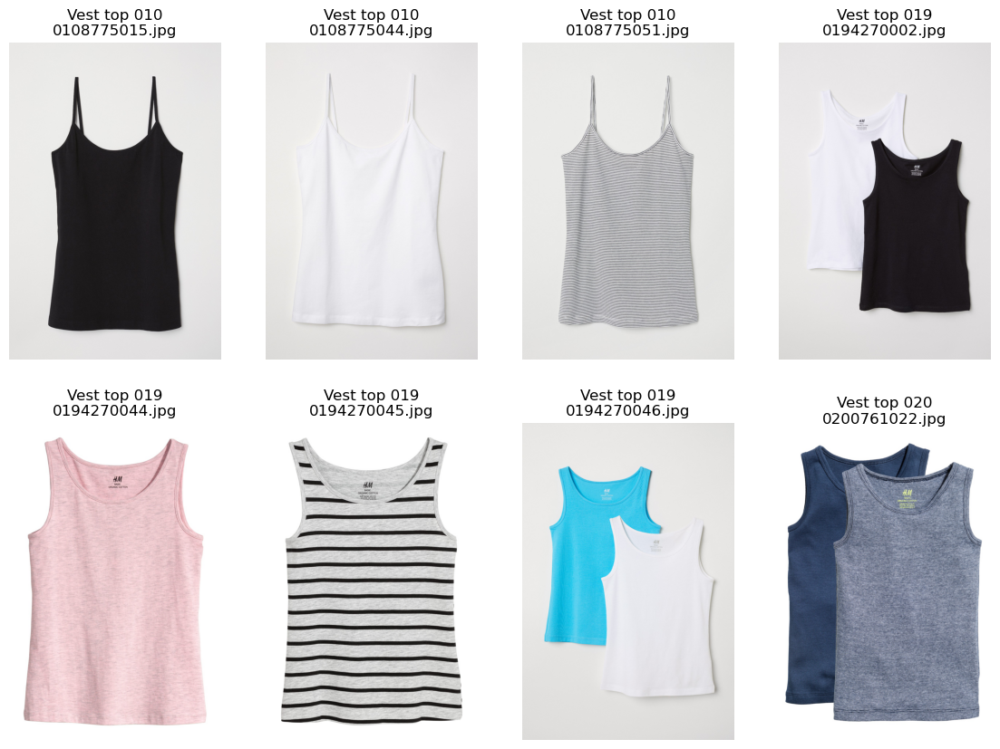

In [14]:
from PIL import Image
plot_image_samples(image_article_df, 'Vest top', 4,2)
# plt.savefig('Vesttop.png')

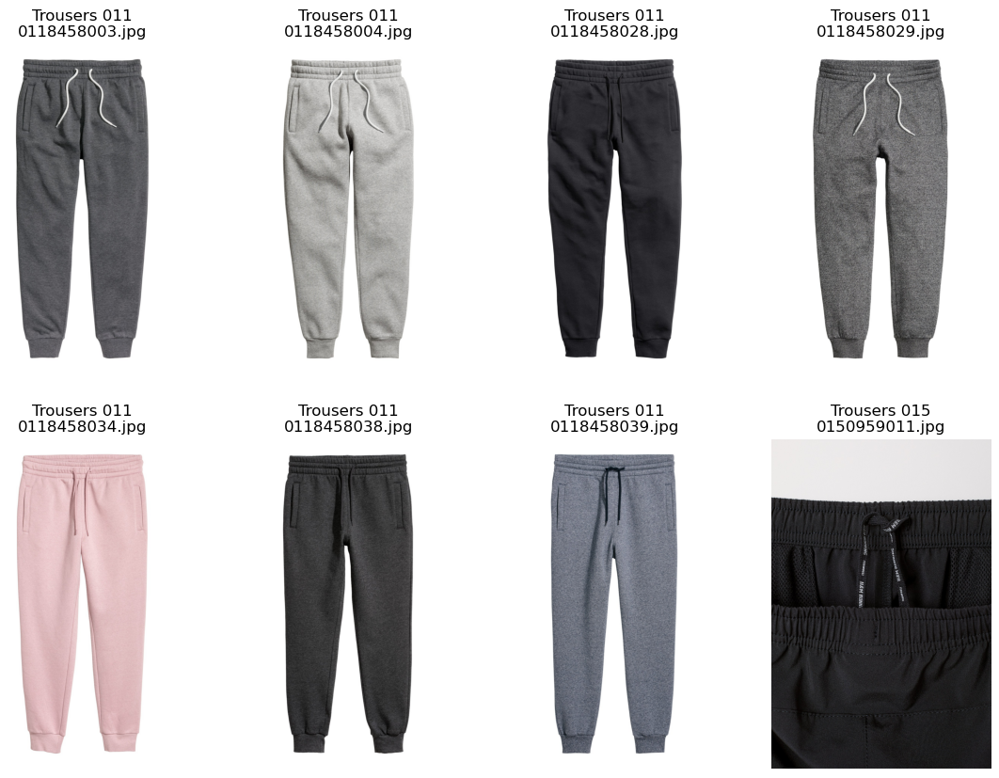

In [15]:
from PIL import Image
plot_image_samples(image_article_df, 'Trousers', 4,2)
# plt.savefig('Trousers.png')

In [176]:
prod_df[prod_df['prod_name']=='Jade HW Skinny Denim TRS']

,product_id,prod_name,detail_desc,product_type_name,product_group_name,index_group_name,section_name,graphical_appearance_name,unit_price,trending
14250,706016,Jade HW Skinny Denim TRS,High-waisted jeans in washed superstretch deni...,Trousers,Garment Lower body,Divided,Divided Collection,Solid,0.033881,True


In [185]:
def plot_image_samples2(image_article_df, product_code, cols=1, rows=-1):
    image_path = "/Users/wellswang/Documents/BrainStation/DS/Capstone/CapstoneProject-BS/notebooks/data/images/"
    _df = image_article_df.loc[image_article_df.product_code==product_code]
    article_ids = _df.article_id.values[0:cols*rows]
    plt.figure(figsize=(2 + 3 * cols, 2 + 4 * rows))
    for i in range(cols * rows):
        article_id = ("0" + str(article_ids[i]))[-10:]
        plt.subplot(rows, cols, i + 1)
        plt.axis('off')
        plt.title(f"{product_code} {article_id[:3]}\n{article_id}.jpg")
        image = Image.open(f"{image_path}{article_id[:3]}/{article_id}.jpg")
        plt.imshow(image)

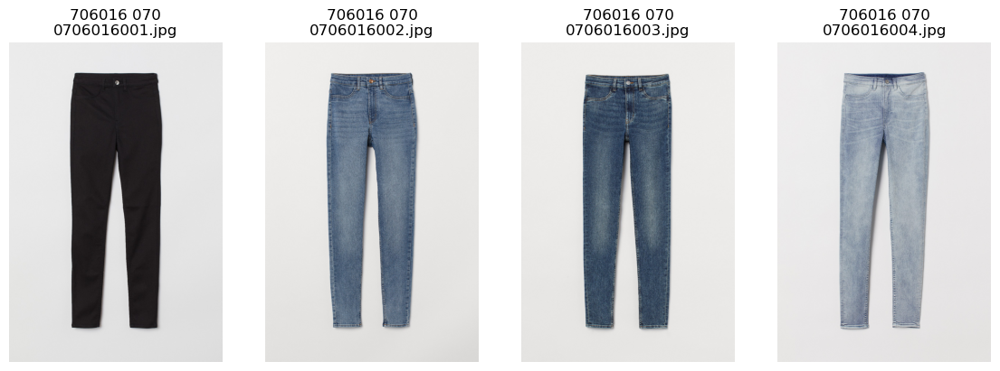

In [189]:
plot_image_samples2(image_article_df, 706016, 4, 1)

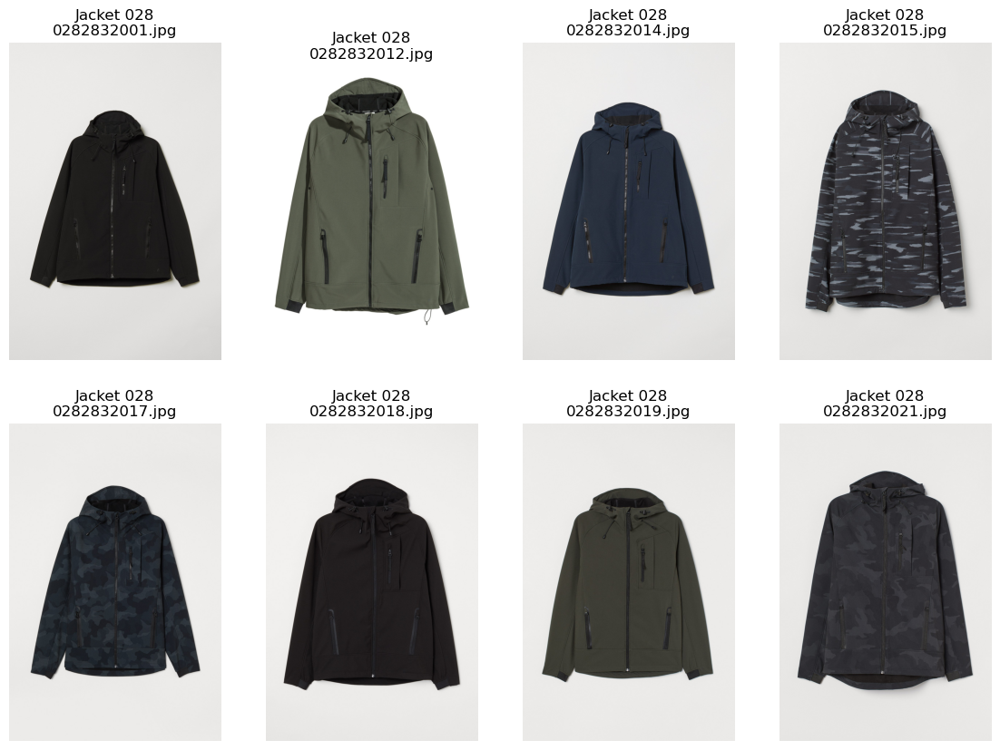

In [194]:
plot_image_samples(image_article_df, 'Jacket', 4,2)

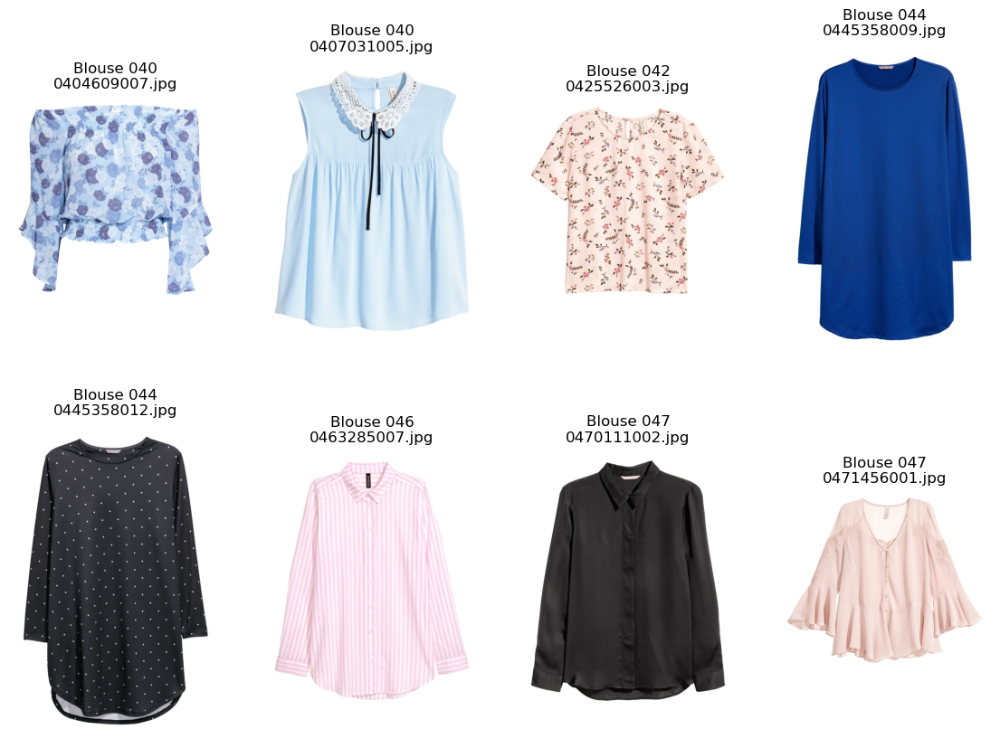

In [195]:
plot_image_samples(image_article_df, 'Blouse', 4,2)

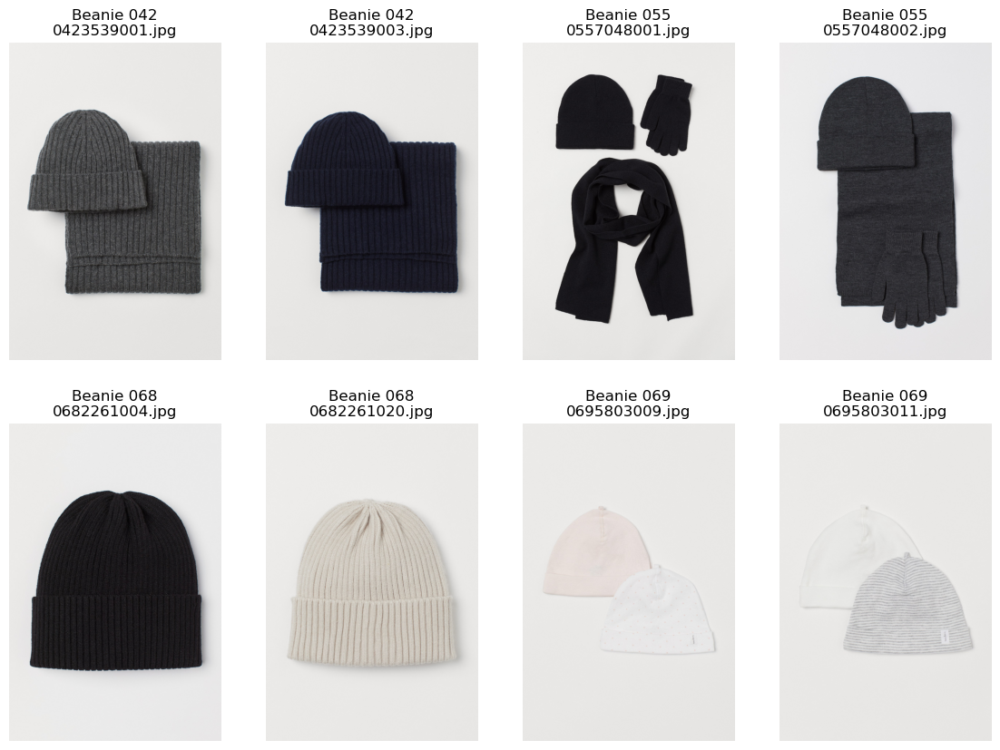

In [196]:
plot_image_samples(image_article_df, 'Beanie', 4,2)

In [199]:
def plot_image_samples_sec(image_article_df, section_name, cols=1, rows=-1):
    image_path = "/Users/wellswang/Documents/BrainStation/DS/Capstone/CapstoneProject-BS/notebooks/data/images/"
    _df = image_article_df.loc[image_article_df.section_name==section_name]
    article_ids = _df.article_id.values[0:cols*rows]
    plt.figure(figsize=(2 + 3 * cols, 2 + 4 * rows))
    for i in range(cols * rows):
        article_id = ("0" + str(article_ids[i]))[-10:]
        plt.subplot(rows, cols, i + 1)
        plt.axis('off')
        plt.title(f"{section_name} {article_id[:3]}\n{article_id}.jpg")
        image = Image.open(f"{image_path}{article_id[:3]}/{article_id}.jpg")
        plt.imshow(image)

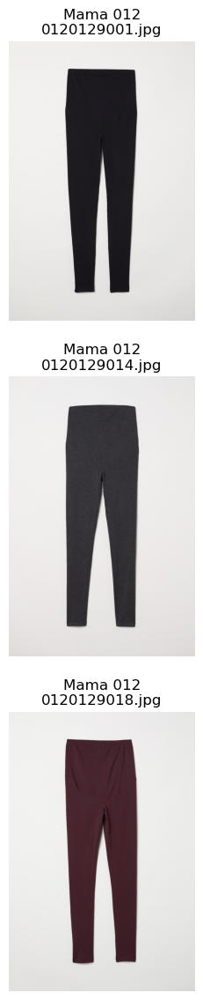

In [212]:
plot_image_samples_sec(image_article_df, 'Mama', 1,3)
plt.savefig('Mama.png')

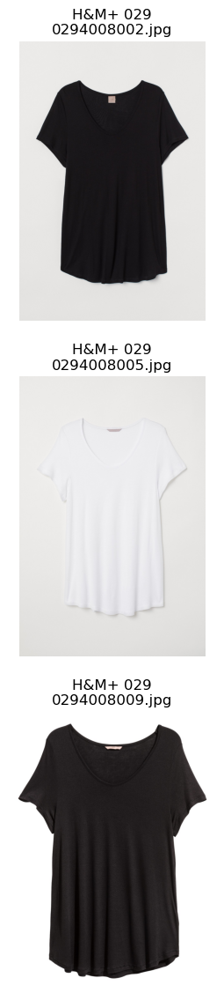

In [214]:
plot_image_samples_sec(image_article_df, 'H&M+', 1,3)
plt.savefig('H&M+.png')

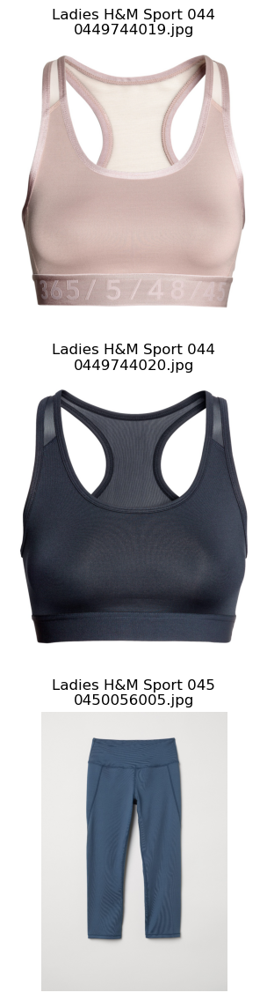

In [215]:
plot_image_samples_sec(image_article_df, 'Ladies H&M Sport', 1,3)
plt.savefig('Ladies H&M Sport.png')

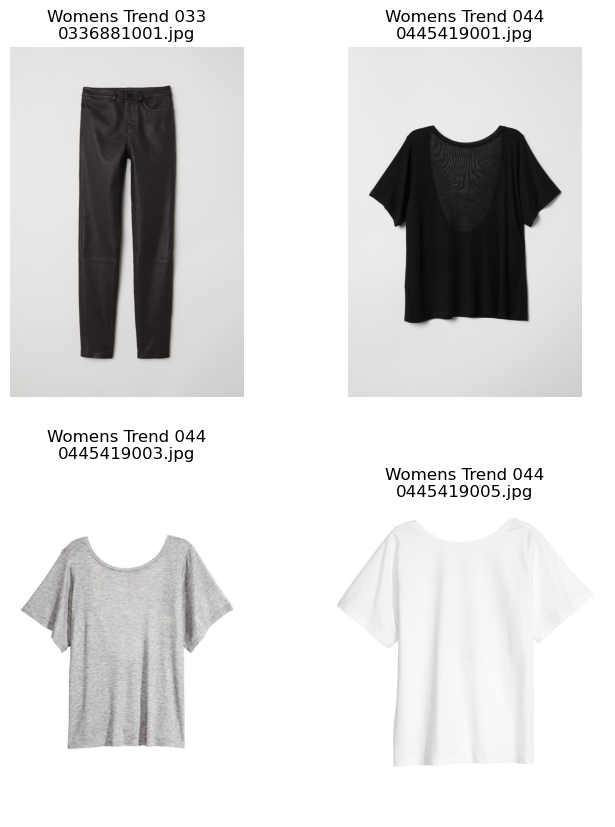

In [218]:
plot_image_samples_sec(image_article_df, 'Womens Trend', 2,2)
plt.savefig('Womens Trend.png')

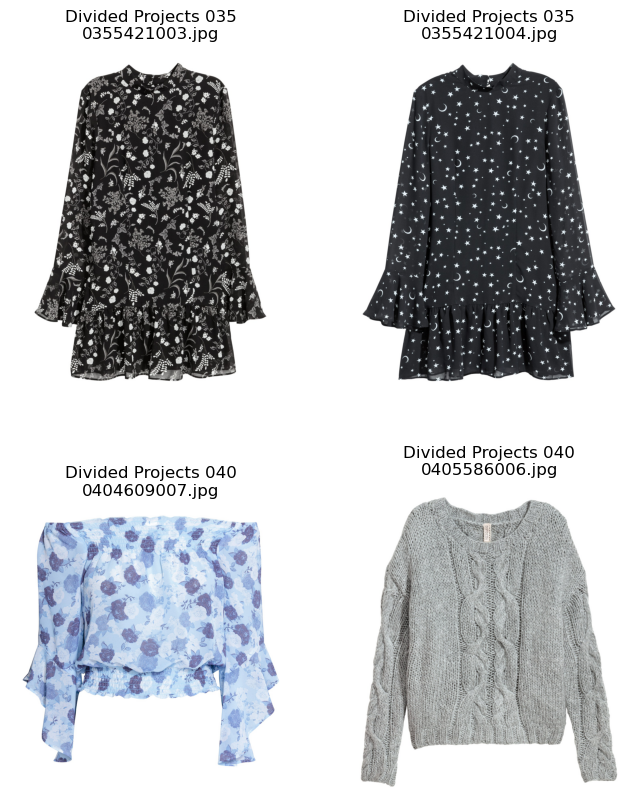

In [219]:
plot_image_samples_sec(image_article_df, 'Divided Projects', 2,2)
plt.savefig('Divided Projects.png')

In [220]:
articles.section_name.nunique()

56

In [241]:
candidates = pd.read_csv('data/candidates.csv')
candidates

,model_name,model_params,precision,recall,f1_score,accuracy,false_positive_rate,best
0,LogisticRegression,{'C': 0.01},0.271296,0.877285,0.414431,0.737743,0.278764,recall
1,SVM,"{'C': 0.01, 'kernel': 'rbf'}",0.262642,0.874674,0.403979,0.726971,0.290502,recall
2,XGBoost,"{'clf__learning_rate': 0.01, 'clf__n_estimator...",0.262928,0.862924,0.403049,0.729595,0.286178,recall
3,RandomForest,"{'clf__max_depth': 5, 'clf__min_samples_leaf':...",0.254770,0.592689,0.356358,0.773512,0.205097,recall
4,SVM,"{'C': 1, 'kernel': 'rbf'}",0.407149,0.609661,0.488238,0.864798,0.105019,f1_score
5,LogisticRegression,{'C': 1},0.321558,0.808094,0.460052,0.799337,0.201699,f1_score
6,XGBoost,"{'learning_rate': 0.05, 'n_estimators': 200}",0.406061,0.524804,0.457859,0.868526,0.090811,f1_score
7,RandomForest,"{'max_depth': 15, 'min_samples_leaf': 3, 'min_...",0.374637,0.505222,0.430239,0.858445,0.099768,f1_score


In [242]:
xgbert = pd.read_csv('data/XGBoost-BERT_results.csv')
lrbert = pd.read_csv('data/LR-BERT_results.csv')
bert = pd.concat([xgbert,lrbert], ignore_index=True)
bert_best = bert.loc[bert.groupby('model_name')['recall'].idxmax()]
bert_best['best'] = bert_best['model_name']+'-recall'
candidates['best'] = candidates['model_name']+'-'+candidates['best']
candidates = pd.concat([candidates,bert_best], ignore_index=True)
candidates

,model_name,model_params,precision,recall,f1_score,accuracy,false_positive_rate,best
0,LogisticRegression,{'C': 0.01},0.271296,0.877285,0.414431,0.737743,0.278764,LogisticRegression-recall
1,SVM,"{'C': 0.01, 'kernel': 'rbf'}",0.262642,0.874674,0.403979,0.726971,0.290502,SVM-recall
2,XGBoost,"{'clf__learning_rate': 0.01, 'clf__n_estimator...",0.262928,0.862924,0.403049,0.729595,0.286178,XGBoost-recall
3,RandomForest,"{'clf__max_depth': 5, 'clf__min_samples_leaf':...",0.254770,0.592689,0.356358,0.773512,0.205097,RandomForest-recall
4,SVM,"{'C': 1, 'kernel': 'rbf'}",0.407149,0.609661,0.488238,0.864798,0.105019,SVM-f1_score
5,LogisticRegression,{'C': 1},0.321558,0.808094,0.460052,0.799337,0.201699,LogisticRegression-f1_score
6,XGBoost,"{'learning_rate': 0.05, 'n_estimators': 200}",0.406061,0.524804,0.457859,0.868526,0.090811,XGBoost-f1_score
7,RandomForest,"{'max_depth': 15, 'min_samples_leaf': 3, 'min_...",0.374637,0.505222,0.430239,0.858445,0.099768,RandomForest-f1_score
8,LR-BERT,"{'C': 0.01, 'penalty': 'l1', 'solver': 'saga'}",0.257231,0.870757,0.397142,0.720342,0.297452,LR-BERT-recall
9,XGBoost-BERT,"{'clf__learning_rate': 0.01, 'clf__n_estimator...",0.264340,0.860313,0.404419,0.731943,0.283243,XGBoost-BERT-recall


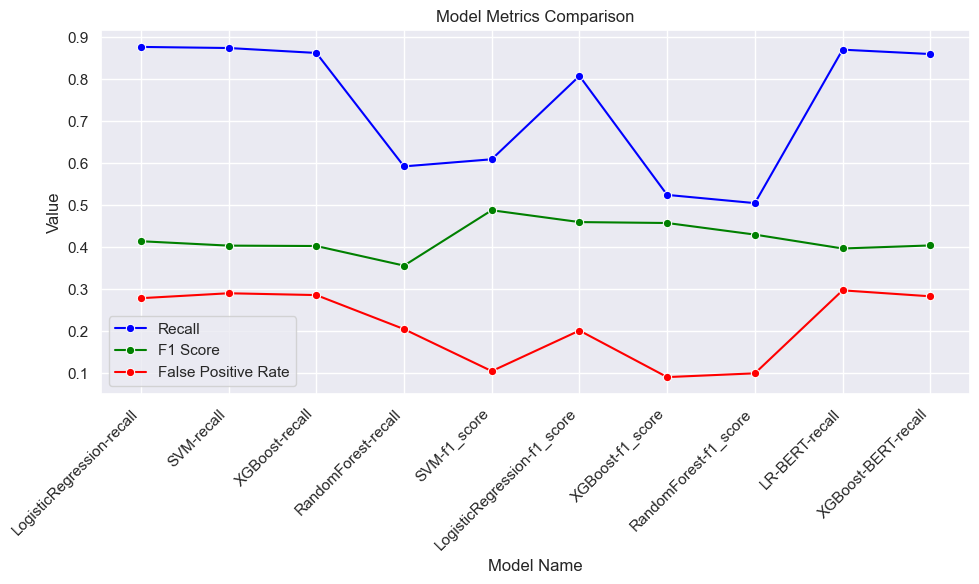

In [245]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

df = candidates.copy()

# Set seaborn style
sns.set(style="darkgrid")

# Plotting
plt.figure(figsize=(10, 6))

# Recall
sns.lineplot(x='best', y='recall', data=df, marker='o', label='Recall', color='blue')

# F1 Score
sns.lineplot(x='best', y='f1_score', data=df, marker='o', label='F1 Score', color='green')

# False Positive Rate
sns.lineplot(x='best', y='false_positive_rate', data=df, marker='o', label='False Positive Rate', color='red')

# Labels and title
plt.xlabel('Model Name')
plt.ylabel('Value')
plt.title('Model Metrics Comparison')
plt.legend()

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Show the plot
plt.tight_layout()
plt.savefig('Model Comparison.png')
plt.show()


# Time Series

In [251]:
hm_sales_processed = pd.read_csv('data/hm_sales_processed.csv')

In [6]:
# selecting top selling product as sample_product
top_prod = 120129

# filter df
df = hm_sales_processed[hm_sales_processed['product_id']==top_prod]
name = df['prod_name'].unique()[0]
print(f'top product: {name}')

# Calculate the percentage of sales for this product compared to tatal
prod_sales_pct = round(df.shape[0]*100/ hm_sales_processed.shape[0],2)
print(f'Percentage of Sales: {prod_sales_pct}%')

# timeseries prep
df['t_dat']=pd.to_datetime(df['t_dat'])
df = df.set_index('t_dat')

# Keeping only units column
df = df.loc[:,['units']] 

# Aggregate by week
df = df.resample('W').sum()
df.T.head()

top product: Jade HW Skinny Denim TRS
Percentage of Sales: 0.63%


t_dat,2018-11-04,2018-11-11,2018-11-18,2018-11-25,2018-12-02,2018-12-09,2018-12-16,2018-12-23,2018-12-30,2019-01-06,...,2020-07-26,2020-08-02,2020-08-09,2020-08-16,2020-08-23,2020-08-30,2020-09-06,2020-09-13,2020-09-20,2020-09-27
units,10,32,41,149,373,1094,1141,913,956,1526,...,2112,1774,1173,1224,1655,2185,2202,2619,1464,427


n_transactions for 'Jade HW Skinny Denim TRS' attributed 0.63% of total transactions. Let's visualize the sales over time for this product:

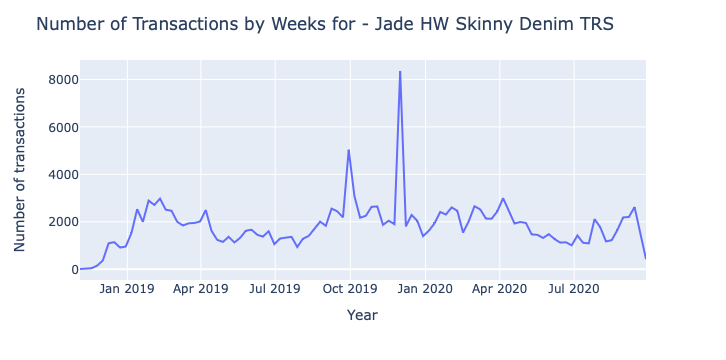

In [7]:
# looking at the sales for this product over time
fig = px.line(df, x=df.index, y="units",)
fig.update_layout(
    yaxis_title="Number of transactions", 
    xaxis_title="Year",
    legend_title="", 
    title=f"Number of Transactions by Weeks for - {name}"
)
fig.show();

# EDA - Case Studies

In the previous anaysis, we drop some categorical columns for reducing the dimension of our model. However, we found that some columns with high variances actually have high importance when predicting trending. Here we did a case study by bringing the columns back and conduct an EDA with it.

In [3]:
hm_sales = pd.read_csv('data/hm_sales.csv')
hm_sales.shape

(28813419, 26)

In [4]:
hm_sales.head()

,t_dat,customer_id,article_id,unit_price,units,is_online,product_id,prod_name,product_type_name,product_group_name,...,index_group_name,section_name,garment_group_name,detail_desc,FN,Active,club_member_status,fashion_news_frequency,age,postal_code
0,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,541518023,0.030492,1,1,541518,Rae Push (Melbourne) 2p,Bra,Underwear,...,Ladieswear,Womens Lingerie,"Under-, Nightwear","Lace push-up bras with underwired, moulded, pa...",False,False,ACTIVE,NONE,24.0,64f17e6a330a85798e4998f62d0930d14db8db1c054af6...
1,2018-09-20,000058a12d5b43e67d225668fa1f8d618c13dc232df0ca...,663713001,0.050831,1,1,663713,Atlanta Push Body Harlow,Underwear body,Underwear,...,Ladieswear,Womens Lingerie,"Under-, Nightwear","Lace push-up body with underwired, moulded, pa...",False,False,ACTIVE,NONE,24.0,64f17e6a330a85798e4998f62d0930d14db8db1c054af6...
2,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,505221001,0.020322,1,1,505221,Inca Jumper,Sweater,Garment Upper body,...,Divided,Divided Selected,Knitwear,Jumper in rib-knit cotton with hard-worn detai...,True,True,ACTIVE,Regularly,32.0,8d6f45050876d059c830a0fe63f1a4c022de279bb68ce3...
3,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,505221004,0.015237,1,1,505221,Inca Jumper,Sweater,Garment Upper body,...,Divided,Divided Selected,Knitwear,Jumper in rib-knit cotton with hard-worn detai...,True,True,ACTIVE,Regularly,32.0,8d6f45050876d059c830a0fe63f1a4c022de279bb68ce3...
4,2018-09-20,00007d2de826758b65a93dd24ce629ed66842531df6699...,685687001,0.016932,1,1,685687,W YODA KNIT OL OFFER,Sweater,Garment Upper body,...,Ladieswear,Womens Everyday Collection,Special Offers,V-neck knitted jumper with long sleeves and ri...,True,True,ACTIVE,Regularly,32.0,8d6f45050876d059c830a0fe63f1a4c022de279bb68ce3...


**Looking at sections sales over time**

In [11]:
hm_sales.section_name.unique()

array(['Womens Lingerie', 'Divided Selected',
       'Womens Everyday Collection', 'Womens Tailoring',
       'Divided Collection', 'Divided Basics', 'Womens Big accessories',
       'Divided Projects', 'Womens Trend', 'Denim Men',
       'Womens Nightwear, Socks & Tigh', 'Baby Boy', 'Kids Boy',
       'Special Collections', 'Kids Accessories, Swimwear & D', 'H&M+',
       'Baby Essentials & Complements', 'Ladies H&M Sport',
       'Womens Everyday Basics', 'Divided Accessories', 'Men Accessories',
       'Contemporary Smart', 'Girls Underwear & Basics', 'Kids Girl',
       'Young Girl', 'Ladies Denim', 'Womens Jackets',
       'Womens Small accessories', 'Baby Girl', 'Womens Shoes',
       'Womens Casual', 'Womens Premium', 'Womens Swimwear, beachwear',
       'Contemporary Casual', 'Kids Outerwear', 'Boys Underwear & Basics',
       'Kids & Baby Shoes', 'Men Underwear', 'Mens Outerwear',
       'Contemporary Street', 'Kids Local Relevance', 'Men Shoes',
       'Men Suits & Tailoring'

In [4]:
# Creating a function for retrieving weekly sales with input section
def weekly_sales_section(section_name):
    # filter df
    df = hm_sales[hm_sales['section_name']==section_name]
    name = df['section_name'].unique()[0]
    print(f'section: {section_name}')
    
    # Calculate the percentage of sales for this product compared to tatal
    sales_pct = round(df.shape[0]*100/ hm_sales.shape[0],2)
    print(f'Percentage of Sales: {sales_pct}%')
    
    # timeseries prep
    df['t_dat']=pd.to_datetime(df['t_dat'])
    df = df.set_index('t_dat')
    
    # Keeping only units column
    df = df.loc[:,['units']] 
    
    # Aggregate by week
    df = df.resample('W').sum()
    return df

In [5]:
# selecting top selling product as sample_product
section_name = 'Womens Everyday Collection'
WEC_weekly = weekly_sales_section(section_name)
WEC_weekly.T.head()

section: Womens Everyday Collection
Percentage of Sales: 18.61%


t_dat,2018-09-23,2018-09-30,2018-10-07,2018-10-14,2018-10-21,2018-10-28,2018-11-04,2018-11-11,2018-11-18,2018-11-25,...,2020-07-26,2020-08-02,2020-08-09,2020-08-16,2020-08-23,2020-08-30,2020-09-06,2020-09-13,2020-09-20,2020-09-27
units,33243,74105,41946,55918,53191,66074,49276,45730,46905,81009,...,48738,51836,54583,49347,45949,52773,48871,55313,48859,13716


In [6]:
df = WEC_weekly
# looking at the sales for this product over time
fig = px.line(df, x=df.index, y="units",)
fig.update_layout(
    yaxis_title="Number of transactions", 
    xaxis_title="Year",
    legend_title="", 
    title=f"Number of Transactions by Weeks for - {name}"
)
fig.show();

NameError: name 'name' is not defined

section: H&M+
Percentage of Sales: 1.73%
section: Womens Everyday Collection
Percentage of Sales: 18.61%


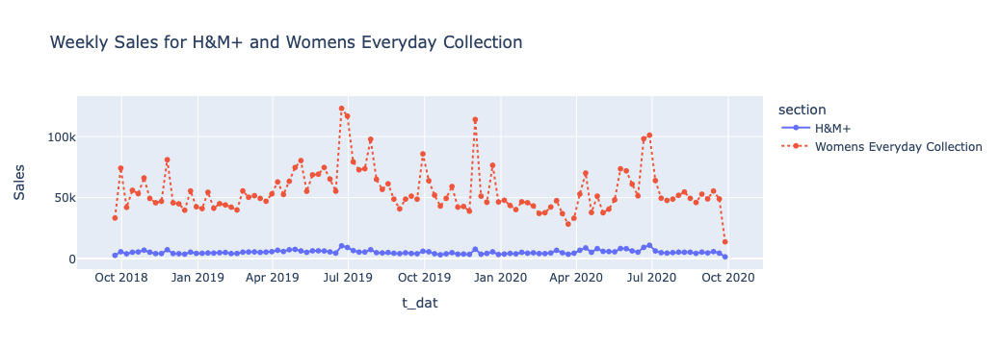

In [30]:
# Comparing sales of different sections
def compare_section_weekly_sales(sec_A, sec_B):
    df_A = weekly_sales_section(sec_A)
    df_B = weekly_sales_section(sec_B)
    df_A['section'] = sec_A
    df_B['section'] = sec_B
    df = pd.concat([df_A, df_B])

    # Create line plot with two categories
    fig = px.line(df, x=df.index, y='units', color='section', markers=True, line_dash='section',
              labels={'df.index': 'Time', 'units': 'Sales'},
              title=f'Weekly Sales for {sec_A} and {sec_B}')
    fig.show()

compare_section_weekly_sales('H&M+', 'Womens Everyday Collection')


In [1]:
compare_section_weekly_sales('H&M+', 'Ladies H&M Sport')

NameError: name 'compare_section_weekly_sales' is not defined

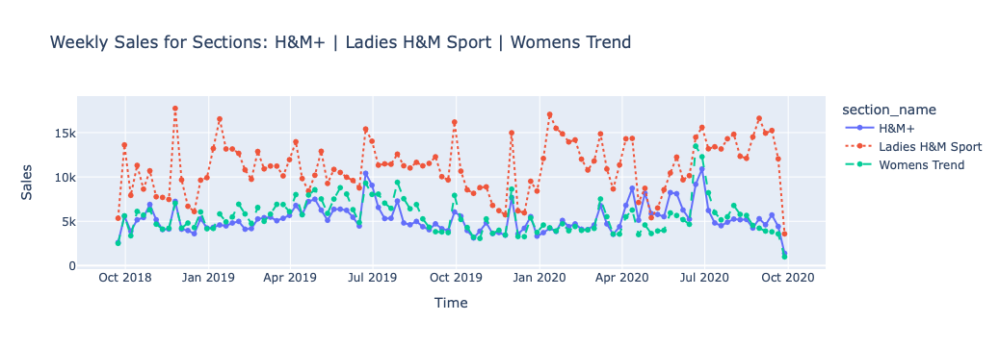

In [60]:
# Comparing sales of different sections
def compare_section_weekly_sales(sections):
    # filter df
    df = hm_sales[hm_sales['section_name'].isin(sections)]
    # timeseries prep
    df['t_dat']=pd.to_datetime(df['t_dat'])
    df = df.set_index('t_dat')
    df = df.groupby('section_name')['units'].resample('W').sum().reset_index()

    # Create line plot with two categories
    fig = px.line(df, x='t_dat', y='units', color='section_name', markers=True, line_dash='section_name',
              labels={'t_dat': 'Time', 'units': 'Sales'},
              title='Weekly Sales for Sections: ' +' | '.join([f"{i}" for i in sections]))
    fig.show()

sections = ['H&M+', 'Ladies H&M Sport', 'Womens Trend']
compare_section_weekly_sales(sections)


# Case Study - Trending Analysis

Here we want to analyze how trending correponds to each category columns.

In [99]:
prod_df = pd.read_csv('data/prod_df.csv')

In [88]:
prod_df

,product_id,prod_name,detail_desc,product_type_name,product_group_name,index_group_name,section_name,graphical_appearance_name,unit_price,trending
0,541518,Rae Push (Melbourne) 2p,"Lace push-up bras with underwired, moulded, pa...",Bra,Underwear,Ladieswear,Womens Lingerie,Solid,0.030492,True
1,663713,Atlanta Push Body Harlow,"Lace push-up body with underwired, moulded, pa...",Underwear body,Underwear,Ladieswear,Womens Lingerie,Solid,0.050831,False
2,505221,Inca Jumper,Jumper in rib-knit cotton with hard-worn detai...,Sweater,Garment Upper body,Divided,Divided Selected,Melange,0.020322,False
3,685687,W YODA KNIT OL OFFER,V-neck knitted jumper with long sleeves and ri...,Sweater,Garment Upper body,Ladieswear,Womens Everyday Collection,Melange,0.016932,True
4,501323,Thomas paperbag wide,"Trousers in woven fabric with a high, paper ba...",Trousers,Garment Lower body,Ladieswear,Womens Tailoring,Check,0.059305,True
...,...,...,...,...,...,...,...,...,...,...
36198,875646,Emanuel set,Set with a long-sleeved top in sweatshirt fabr...,Trousers,Garment Lower body,Baby/Children,Kids Boy,All over pattern,0.033881,False
36199,900550,COLLAB W.CHEN JOGGER,Whooli Chen x H&M. Joggers in sweatshirt fabri...,Trousers,Garment Lower body,Baby/Children,Kids Boy,All over pattern,0.030492,False
36200,930405,Ghost L/S,Calf-length dress in a jacquard weave with a r...,Dress,Garment Full body,Ladieswear,Womens Everyday Collection,Other structure,0.067780,False
36201,930283,Chip Hood 19.99:-,Hoodie in soft sweatshirt fabric with a text p...,Hoodie,Garment Upper body,Menswear,Contemporary Street,Placement print,0.033881,False


In [64]:
prod_df['product_group_name'].value_counts()

product_group_name
Garment Upper body    17165
Garment Lower body     8491
Garment Full body      7192
Underwear              1965
Swimwear               1390
Name: count, dtype: int64

In [73]:
prod_df['trending']==1

0         True
1        False
2        False
3         True
4         True
         ...  
36198    False
36199    False
36200    False
36201    False
36202    False
Name: trending, Length: 36203, dtype: bool

In [109]:
df = prod_df.copy()
df['trending'] = np.where(df['trending'], 'yes', 'no')

def trending_by_columns(df, column):
    rate_data = df.groupby([column, "trending"])["trending"].count() / df.groupby(column)["trending"].count()
    rate_data.unstack()[["yes", "no"]].sort_values("no").head(10).plot(kind="barh", stacked=True, color=["cornflowerblue", "lightcoral"])
    plt.title(f"Registration rate per {column} category")
    sns.despine()
    plt.show()


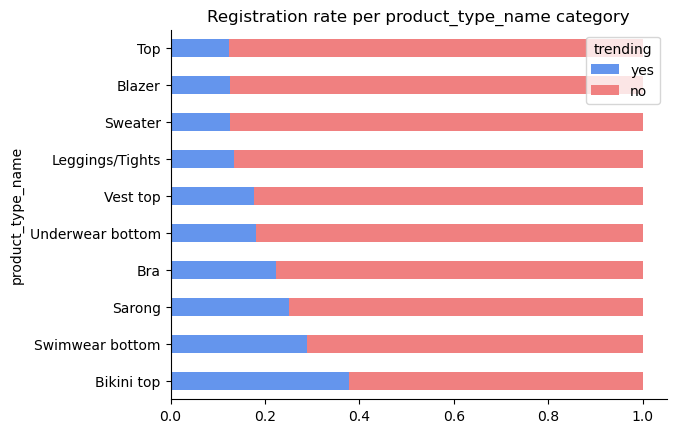

In [110]:
col = "section_name"
col = 'product_type_name'
trending_by_columns(df, col)

In [115]:
c = hm_sales.product_type_name.value_counts().reset_index()

In [119]:
c[c['count'] > hm_sales.shape[0]*0.01]

,product_type_name,count
0,Trousers,3725520
1,Dress,2918786
2,Sweater,2614740
3,T-shirt,2003299
4,Top,1465853
5,Blouse,1389973
6,Vest top,1258605
7,Bra,1237163
8,Shorts,1041512
9,Bikini top,961314
